#### Effect of Weather on Uber Rides in New York City

In [1]:
# Import the libraries

import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['savefig.dpi'] = 300
plt.rcParams["figure.dpi"] = 300
import seaborn as sns
sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})

In [2]:
# Load the datasets

nyc_uber = pd.read_csv('nyc_uber.csv')
nyc_weather = pd.read_csv('nyc_weather.csv')

In [3]:
nyc_uber.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49111 entries, 0 to 49110
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   DateTime  49111 non-null  object
 1   Base      49111 non-null  object
 2   Rides     49111 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 1.1+ MB


In [4]:
nyc_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8690 entries, 0 to 8689
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   DateTime       8690 non-null   object 
 1   Description    8690 non-null   object 
 2   Temperature    8690 non-null   float64
 3   Humidity       8652 non-null   float64
 4   Pressure       8690 non-null   float64
 5   WindSpeed      8690 non-null   float64
 6   WindDirection  8690 non-null   float64
dtypes: float64(5), object(2)
memory usage: 475.4+ KB


In [5]:
# Inner join the data sets using "DateTime"

nyc_uber_weather = pd.merge(nyc_uber, nyc_weather, on=['DateTime','DateTime'], how = 'inner')

In [6]:
# Remove the duplicates (if any) 
# check for the missing values

nyc_uber_weather.drop_duplicates(inplace=True)
nyc_uber_weather.isnull().sum()

DateTime           0
Base               0
Rides              0
Description        0
Temperature        0
Humidity         189
Pressure           0
WindSpeed          0
WindDirection      0
dtype: int64

In [7]:
# Extract the following datetime features

nyc_uber_weather['DateTime'] = pd.to_datetime(nyc_uber_weather['DateTime'])
nyc_uber_weather['Year'] = nyc_uber_weather['DateTime'].dt.year
nyc_uber_weather['Month'] = nyc_uber_weather['DateTime'].dt.month
nyc_uber_weather['Day'] = nyc_uber_weather['DateTime'].dt.day
nyc_uber_weather['Weekday'] = nyc_uber_weather['DateTime'].dt.day_name()
nyc_uber_weather['Hour'] = nyc_uber_weather['DateTime'].dt.hour

In [8]:
nyc_uber_weather.head(8)

,DateTime,Base,Rides,Description,Temperature,Humidity,Pressure,WindSpeed,WindDirection,Year,Month,Day,Weekday,Hour
0,2014-04-01 00:00:00,B02512,8,cloudy,9.96,40.0,1016.0,5.0,330.0,2014,4,1,Tuesday,0
1,2014-04-01 00:00:00,B02598,25,cloudy,9.96,40.0,1016.0,5.0,330.0,2014,4,1,Tuesday,0
2,2014-04-01 00:00:00,B02617,20,cloudy,9.96,40.0,1016.0,5.0,330.0,2014,4,1,Tuesday,0
3,2014-04-01 00:00:00,B02682,43,cloudy,9.96,40.0,1016.0,5.0,330.0,2014,4,1,Tuesday,0
4,2014-04-01 00:00:00,B02764,5,cloudy,9.96,40.0,1016.0,5.0,330.0,2014,4,1,Tuesday,0
5,2014-04-01 01:00:00,B02512,4,cloudy,8.83,NaN,1016.0,5.0,340.0,2014,4,1,Tuesday,1
6,2014-04-01 01:00:00,B02598,17,cloudy,8.83,NaN,1016.0,5.0,340.0,2014,4,1,Tuesday,1
7,2014-04-01 01:00:00,B02617,13,cloudy,8.83,NaN,1016.0,5.0,340.0,2014,4,1,Tuesday,1


In [9]:
nyc_uber_weather.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48824 entries, 0 to 48823
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   DateTime       48824 non-null  datetime64[ns]
 1   Base           48824 non-null  object        
 2   Rides          48824 non-null  int64         
 3   Description    48824 non-null  object        
 4   Temperature    48824 non-null  float64       
 5   Humidity       48635 non-null  float64       
 6   Pressure       48824 non-null  float64       
 7   WindSpeed      48824 non-null  float64       
 8   WindDirection  48824 non-null  float64       
 9   Year           48824 non-null  int64         
 10  Month          48824 non-null  int64         
 11  Day            48824 non-null  int64         
 12  Weekday        48824 non-null  object        
 13  Hour           48824 non-null  int64         
dtypes: datetime64[ns](1), float64(5), int64(5), object(3)
memory usage: 5.

In [10]:
# Get the base statistics of the final data

nyc_uber_weather.describe()

,Rides,Temperature,Humidity,Pressure,WindSpeed,WindDirection,Year,Month,Day,Hour
count,48824.000000,48824.000000,48635.000000,48824.000000,48824.000000,48824.000000,48824.000000,48824.000000,48824.000000,48824.000000
mean,111.598620,12.593225,68.576128,1019.506902,2.622276,203.332726,2014.554686,4.894990,15.568839,11.542889
std,229.645724,11.454197,18.999282,9.223876,1.737264,100.811156,0.497006,2.239791,8.714739,6.913471
min,1.000000,-22.226000,10.000000,968.000000,0.000000,0.000000,2014.000000,1.000000,1.000000,0.000000
25%,40.000000,4.147500,54.000000,1013.000000,1.000000,133.000000,2014.000000,3.000000,8.000000,6.000000
50%,60.000000,15.540000,70.000000,1019.000000,2.000000,214.000000,2015.000000,5.000000,16.000000,12.000000
75%,60.000000,21.370000,84.000000,1024.000000,3.000000,290.000000,2015.000000,6.000000,23.000000,18.000000
max,2346.000000,33.820000,100.000000,1052.000000,13.000000,360.000000,2015.000000,9.000000,31.000000,23.000000


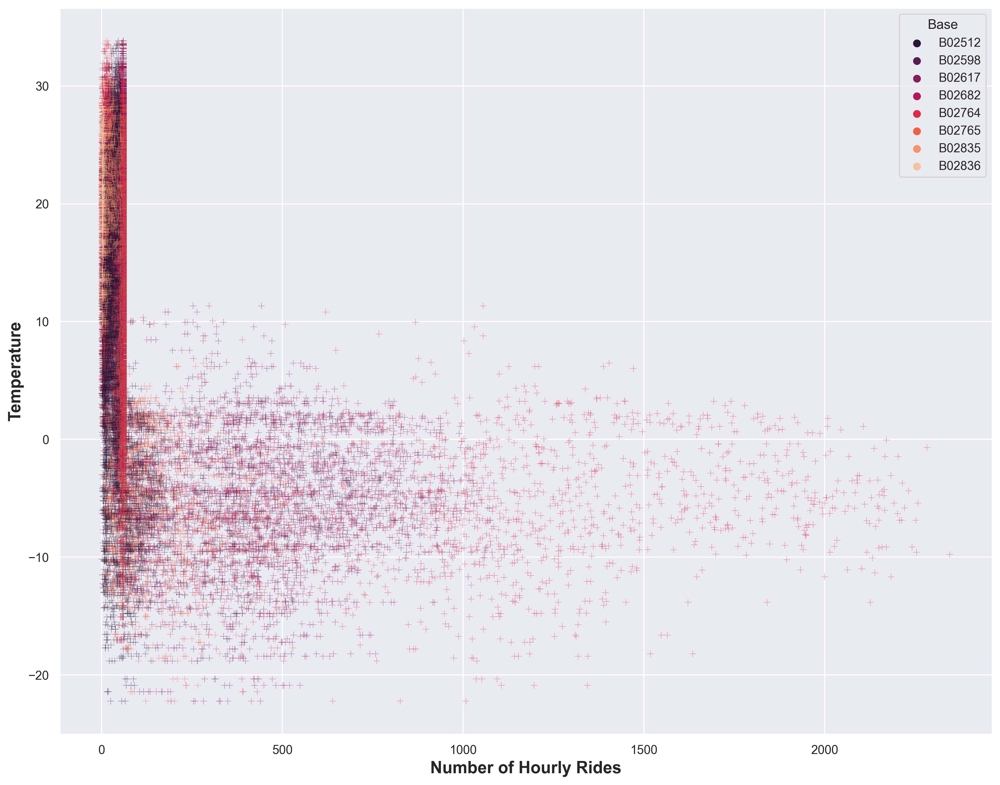

In [11]:
### Plot showing the distribution of hourly rides across bases as a result of change in the temperature

fig, ax = plt.subplots(figsize=(15,12))    
p = sns.scatterplot(x='Rides', y='Temperature', ax=ax, data = nyc_uber_weather, hue = "Base", 
                palette="rocket", alpha = 0.4, marker="+")
p.set_ylabel("Temperature", fontsize = 15, fontweight ='bold')
p.set_xlabel("Number of Hourly Rides", fontsize = 15, fontweight ='bold')
plt.savefig('plot3.png', dpi=300)
plt.show()

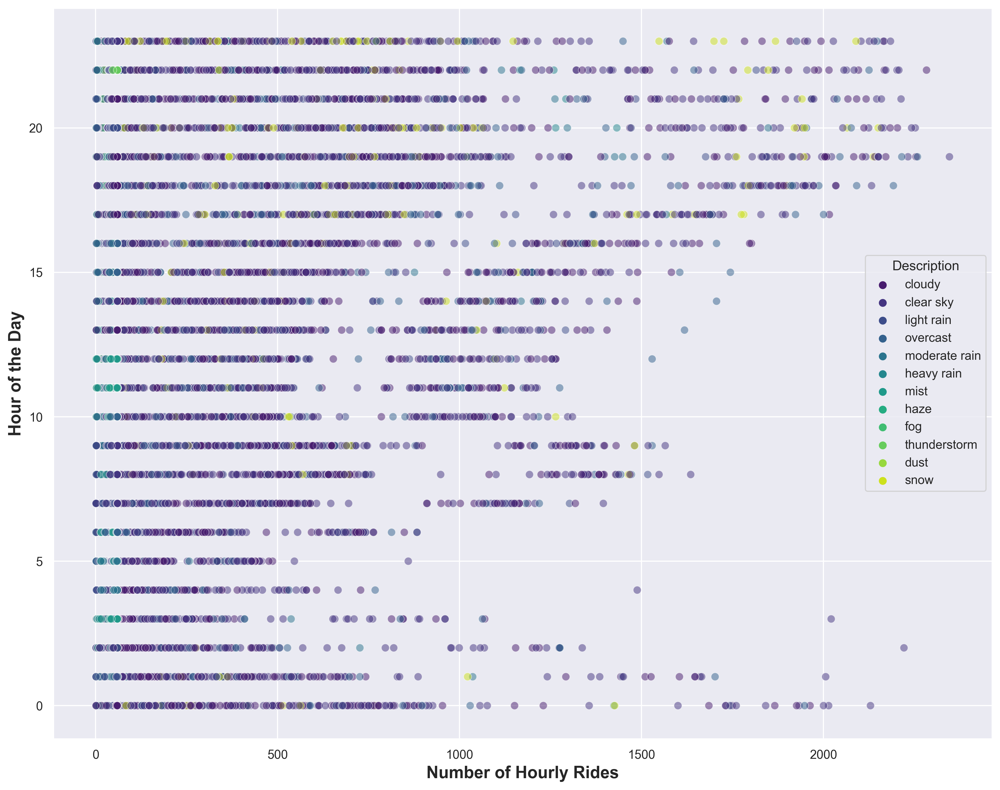

In [12]:
# Plot showing the distribution of hourly rides across different weather conditions

fig, ax = plt.subplots(figsize=(15,12))    
p = sns.scatterplot(data = nyc_uber_weather, x='Rides', y='Hour', ax=ax, hue = "Description", 
                palette="viridis", alpha = 0.5, s=50)
p.set_ylabel("Hour of the Day", fontsize = 15, fontweight ='bold')
p.set_xlabel("Number of Hourly Rides", fontsize = 15, fontweight ='bold')
plt.savefig('plot4.png', dpi=300)
plt.show()

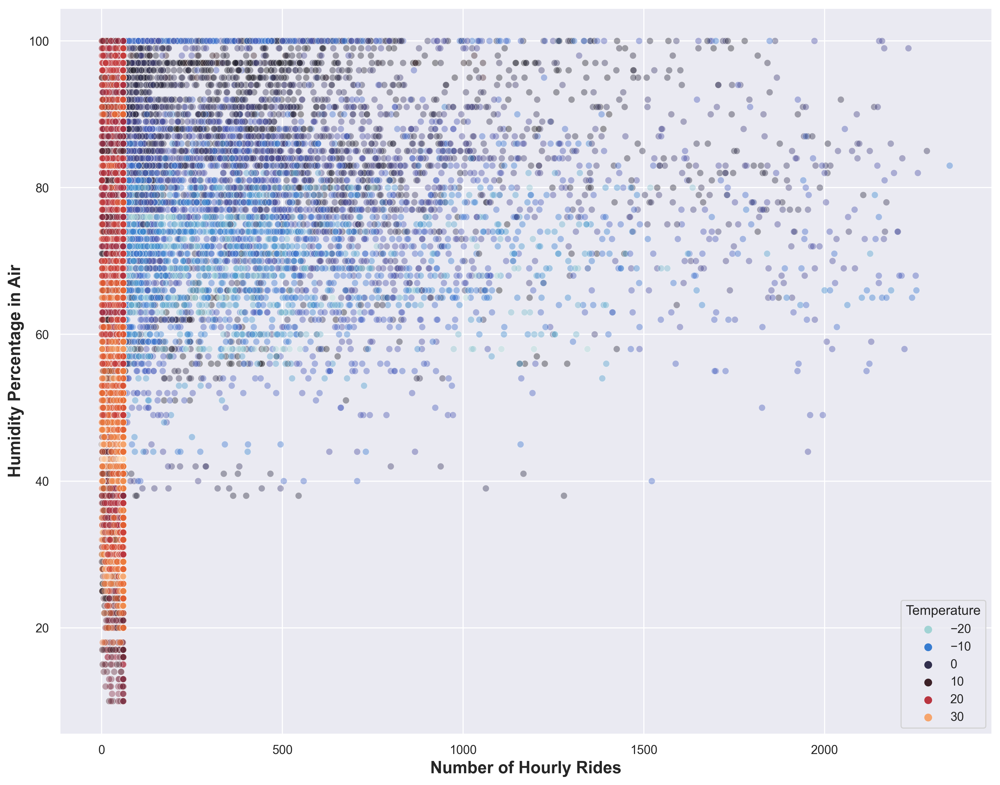

In [13]:
# Plot showing the distribution of hourly rides as a result of changes in the humidity & temperature

fig, ax = plt.subplots(figsize=(15,12))    
p = sns.scatterplot(data = nyc_uber_weather, x='Rides', y='Humidity', ax=ax, hue = "Temperature", 
                palette="icefire", alpha = 0.4)
p.set_ylabel("Humidity Percentage in Air", fontsize = 15, fontweight ='bold')
p.set_xlabel("Number of Hourly Rides", fontsize = 15, fontweight ='bold')
plt.savefig('plot5.png', dpi=300)
plt.show()

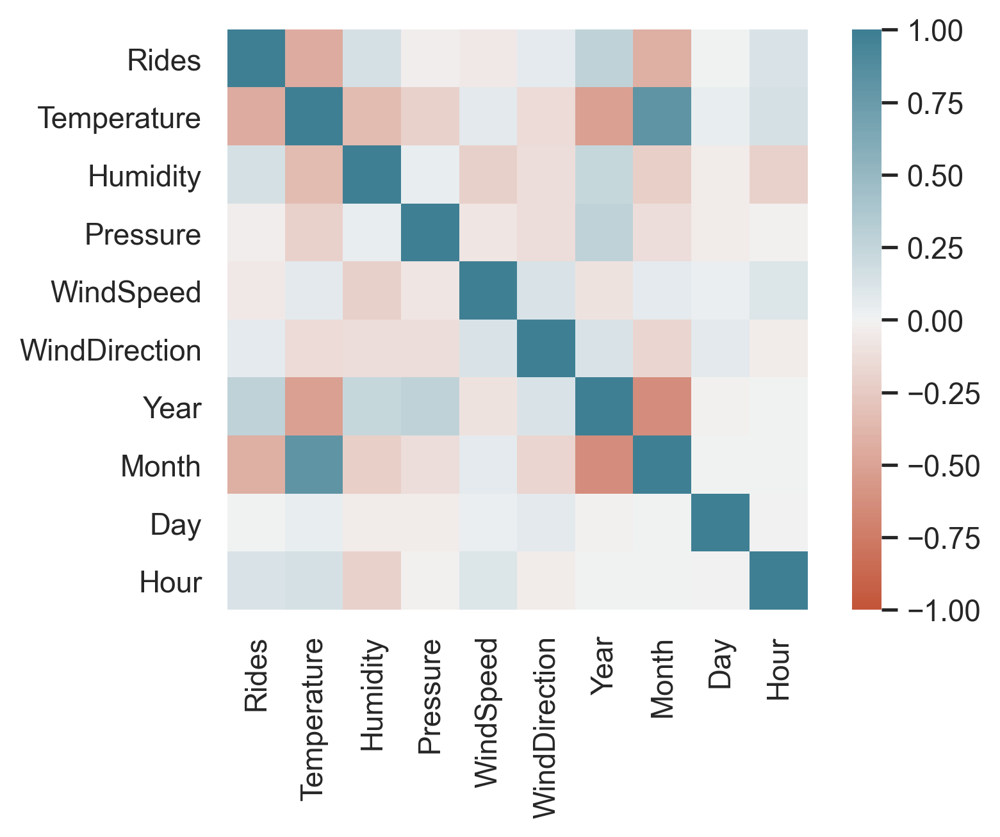

In [14]:
# Correlation plot the data

corr = nyc_uber_weather.corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
plt.savefig('plot6.png', dpi=300)

In [15]:
# One Hot Encoding the categorical columns 

nyc_uber_weather['Month'].astype('object')
nyc_uber_weather['Hour'].astype('object')
temp = pd.get_dummies(nyc_uber_weather[['Base', 'Description', 'Month', 'Weekday', 'Hour']], drop_first=True)

In [16]:
# Separate the Feature & Target columns

X = nyc_uber_weather[['Temperature', 'Humidity', 'Pressure', 'WindSpeed', 'WindDirection','Year', 'Day']]
X = pd.concat([temp, X],axis=1)
temp = X
y = nyc_uber_weather[['Rides']]

In [17]:
# Random data split into train and test data

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20)

In [18]:
# Import libraries for linear regression

from sklearn.impute import KNNImputer
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn import linear_model
from sklearn.linear_model import LinearRegression

In [19]:
# Pipeline linear regression model by prerocessing with knn imputation & scaling
# Generate model metrics

model = linear_model.LinearRegression()
imputer = KNNImputer()
scaler = StandardScaler()
pipeline_model = Pipeline(steps = [ ('s', scaler), ('i', imputer), ('m', model)])

pipeline_model.fit(X_train, y_train)
pipeline_model.score(X_train, y_train)

0.33801855165234873

In [20]:
pipeline_model.score(X_test, y_test)

0.35479192164437645

In [21]:
from sklearn.metrics import mean_squared_error

y_pred = pipeline_model.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared = False)
rmse

184.18994026642778

In [22]:
from sklearn.metrics import r2_score
r2_score = r2_score(y_test, y_pred)
r2_score

0.35479192164437645

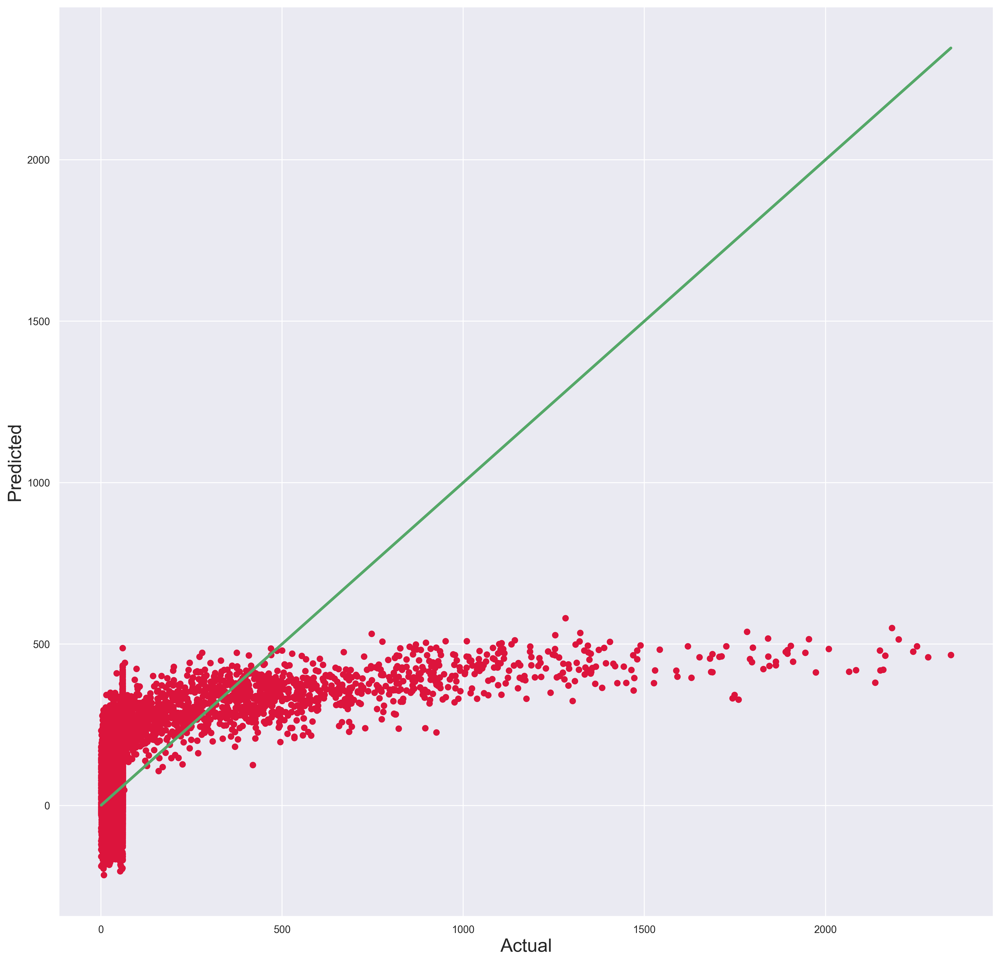

In [23]:
# Predicted vs Actual vlaue plot of the Linear Regression model

fig, ax = plt.subplots(figsize=(18,18))
ax.scatter(y_test, y_pred, c = 'crimson')
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'g-', lw=3)
ax.set_xlabel('Actual', fontsize = 20)
ax.set_ylabel('Predicted', fontsize = 20)
plt.grid(True)
plt.savefig('plot7.png', dpi=300)
plt.show()

In [24]:
coefs = sorted(list(zip(X.columns, pipeline_model.named_steps['m'].coef_[0])), key = lambda x: abs(x[1]))

In [25]:
coefs = pd.DataFrame(coefs, columns = ['Feature', 'Score'])

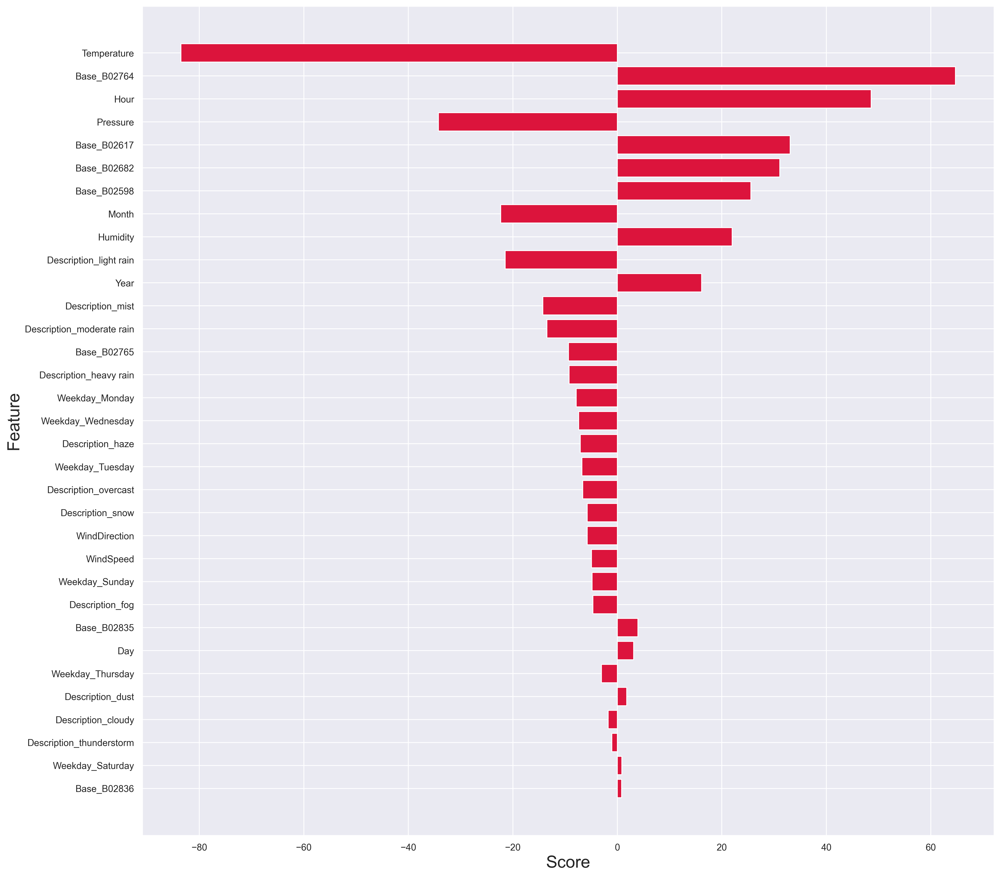

In [26]:
#v Feature Importance plot of the Linear Regression model

plt.figure(figsize = (18,18))
plt.barh(coefs.Feature, coefs.Score, color = 'crimson')
plt.xlabel('Score', fontsize = 20)
plt.ylabel('Feature', fontsize = 20)
plt.savefig('plot8.png', dpi=300)
plt.show()

In [27]:
# Pipeline SGD regressor model by prerocessing with knn imputation & scaling
# Applying huber loss function to cater the outliers
# Generate model metrics

from sklearn.linear_model import SGDRegressor
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

model = SGDRegressor(loss = 'huber')
imputer = KNNImputer()
scaler = StandardScaler()
pipeline_model = Pipeline(steps = [('s', scaler), ('i', imputer), ('m', model)])

pipeline_model.fit(X_train, y_train)
pipeline_model.score(X_train, y_train)

/usr/local/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


-0.01691748115281544

In [28]:
pipeline_model.score(X_test, y_test)

-0.021879853798353333

In [29]:
y_pred = pipeline_model.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared = False)
rmse

231.80133212812234

In [30]:
from sklearn.metrics import r2_score
r2_score = r2_score(y_test, y_pred)
r2_score

-0.021879853798353333

In [31]:
# Pipeline Random Forest regressor model by prerocessing with knn imputation & scaling
# Model is evaluated across max_depth values from 4 to 11 showing increase in accuracy scores
# Generate model metrics

from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

model = RandomForestRegressor(max_depth=11, random_state=0)
imputer = KNNImputer()
scaler = StandardScaler()
pipeline_model = Pipeline(steps = [('s', scaler), ('i', imputer), ('m', model)])

pipeline_model.fit(X_train, y_train)
pipeline_model.score(X_train, y_train)

/usr/local/lib/python3.8/site-packages/sklearn/pipeline.py:335: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self._final_estimator.fit(Xt, y, **fit_params_last_step)


0.9866006409605971

In [32]:
pipeline_model.score(X_test, y_test)

0.965705767865637

In [33]:
y_pred = pipeline_model.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared = False)
rmse

42.46455237456121

In [34]:
from sklearn.metrics import r2_score
r2_score = r2_score(y_test, y_pred)
r2_score

0.965705767865637

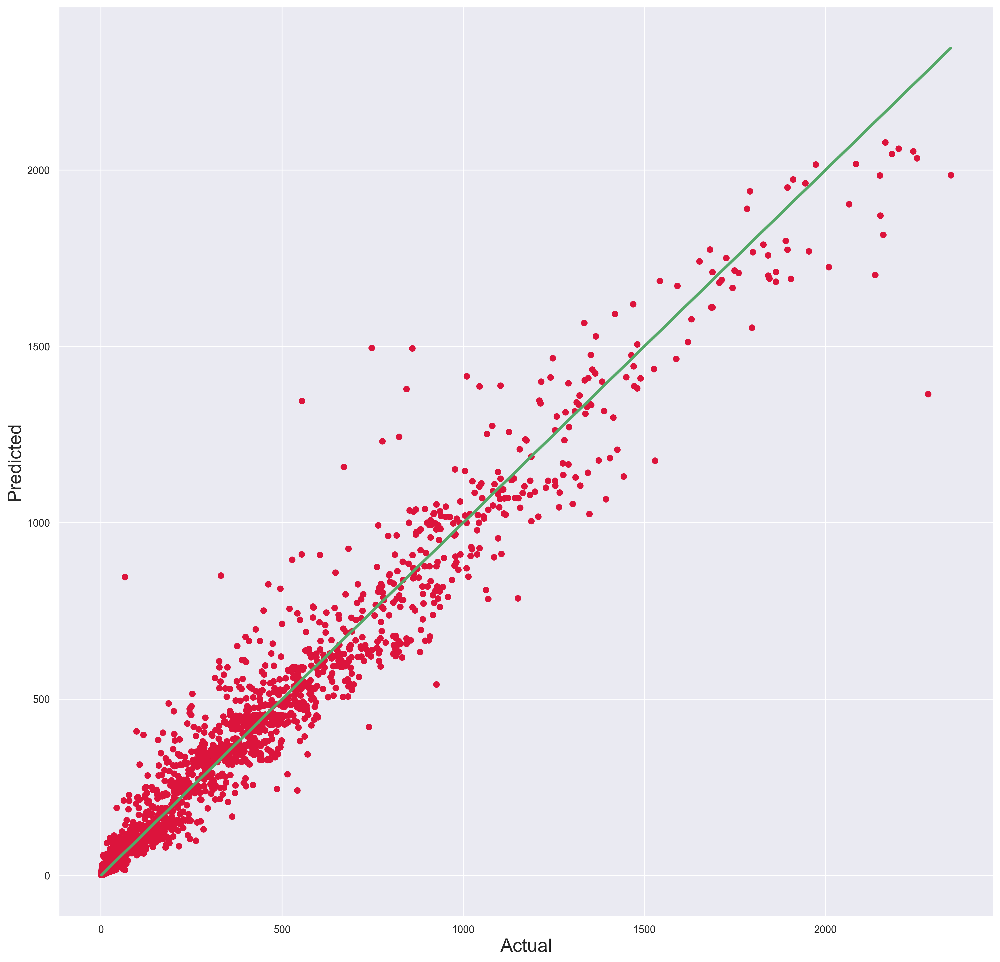

In [35]:
# Predicted vs Actual value plot of the Random Forest regressor model

fig, ax = plt.subplots(figsize=(18,18))
ax.scatter(y_test, y_pred, c = 'crimson')
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'g-', lw=3)
ax.set_xlabel('Actual', fontsize = 20)
ax.set_ylabel('Predicted', fontsize = 20)
plt.grid(True)
plt.savefig('plot9.png', dpi=300)
plt.show()

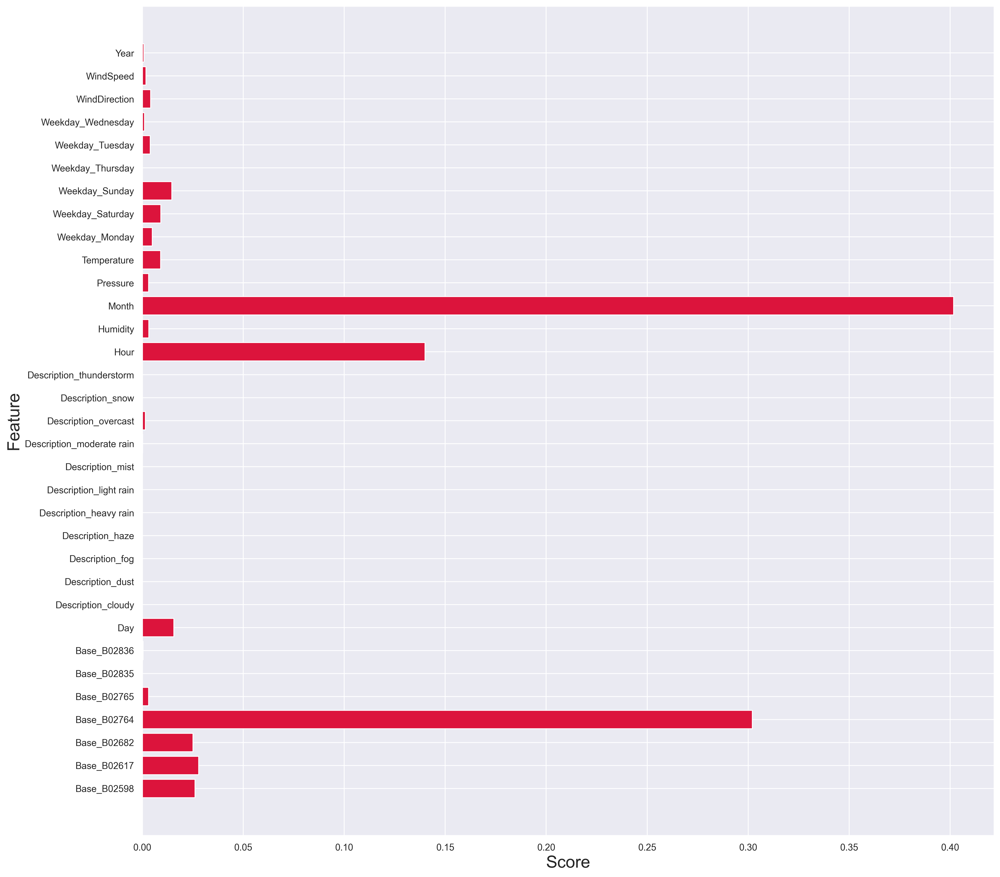

In [36]:
# Fearure importance plot of the Random Forest Regressor model

coefs = sorted(list(zip(X.columns, model.estimators_[99].feature_importances_)))
coefs = pd.DataFrame(coefs, columns = ['Feature', 'Score'])
plt.figure(figsize = (18,18))
plt.barh(coefs.Feature, coefs.Score, color = 'crimson')
plt.xlabel('Score', fontsize = 20)
plt.ylabel('Feature', fontsize = 20)
plt.savefig('plot10.png', dpi=300)
plt.show()

In [37]:
# Save the final data as CSV

# nyc_uber_weather.to_csv('nyc_uber_weather.csv', encoding='utf-8', index=False)